# Import and Setup

Adjust cell width to view more content

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

Import general packages and YLXPS-related packages

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import sys 
import os 
import scipy
import importlib
import datetime as dt
import pandas as pd

plt.style.use('../style.mplstyle')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

sys.path.insert(0, '../../purity-monitor/')
sys.path.insert(0, '../analysis/')
import HelperClasses as Dataset
import StandMonitor as Monitor
import PlotFunctions as Plt

In [3]:
importlib.reload(Dataset)
importlib.reload(Monitor)
importlib.reload(Plt)

<module 'PlotFunctions' from '../analysis\\PlotFunctions.py'>

# Data Read-In

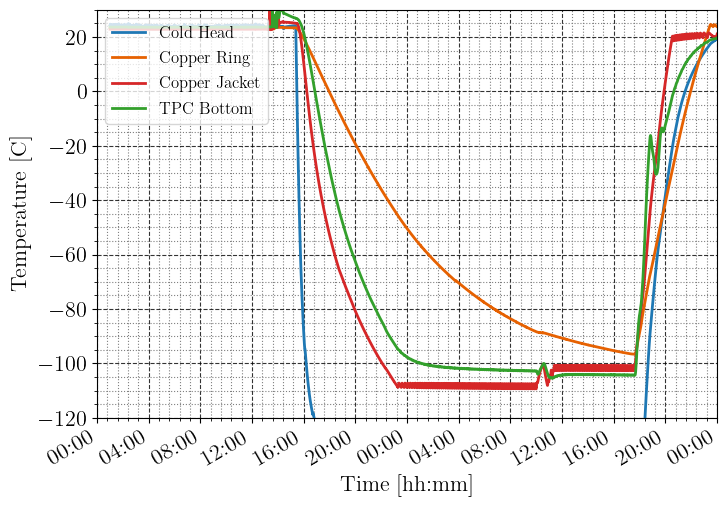

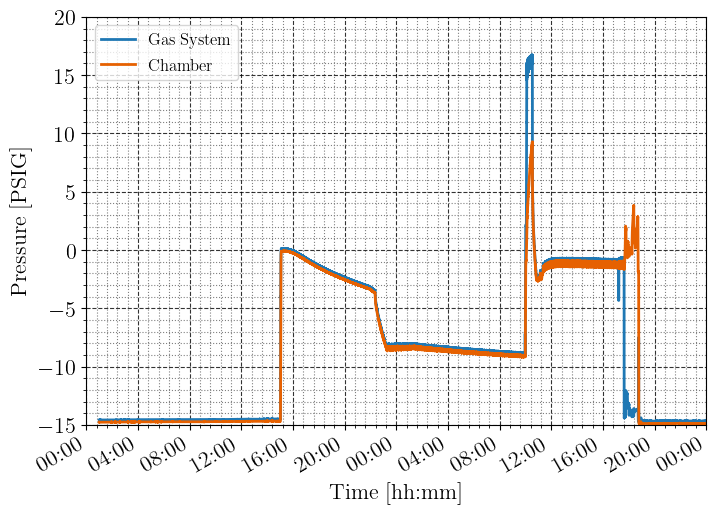

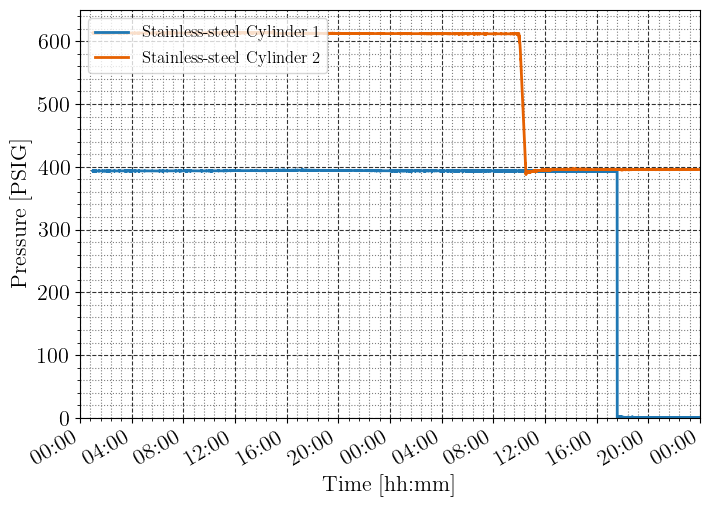

In [4]:
Sensors = []
Files = ['C:/Data/StandStatus/20210314.h5', 'C:/Data/StandStatus/20210315.h5']
for File in Files: 
    Sensor = Monitor.SensorData(Filepath=File)
    Sensor.GetData()
    Sensors.append(Sensor)

AllSensors = Monitor.SensorData()
AllSensors.Combine(Sensors)
XRange = [dt.datetime(2021,3,14,0,0), dt.datetime(2021,3,16,0,0)]
AllSensors.PlotData(Data=AllSensors.Temp, Selection='Temperature', XTicks=240, YTicks=20, XRange=XRange, YRange=[-120,30])
plt.savefig('20210315_temp.png')
AllSensors.PlotData(Data=AllSensors.SPressure, Selection='System Pressure', XTicks=240, YTicks=5, XRange=XRange, YRange=[-15,20])
AllSensors.PlotData(Data=AllSensors.XPressure, Selection='Xenon Pressure', XTicks=240, YTicks=100, XRange=XRange, YRange=[0,650])

 | Filename... C:/Data/20210315\Filling_Au-Thorslabs_C-300V_A-1800V_1.h5
 | Number of files in ch1...	 73/73
 | Number of files in ch2...	 73/73
 | Filename... C:/Data/20210315\Filling_Au-Thorslabs_C-300V_A-1800V_2.h5
 | Number of files in ch1...	 68/141
 | Number of files in ch2...	 68/141
 | Filename... C:/Data/20210315\Filling_Au-Thorslabs_C-300V_A-1800V_3.h5
 | Number of files in ch1...	 56/197
 | Number of files in ch2...	 56/197
 | Processing data in channel 1...
 | Processing data in channel 2...
 | Time elapsed:  18.0625 sec
153
172
153
172


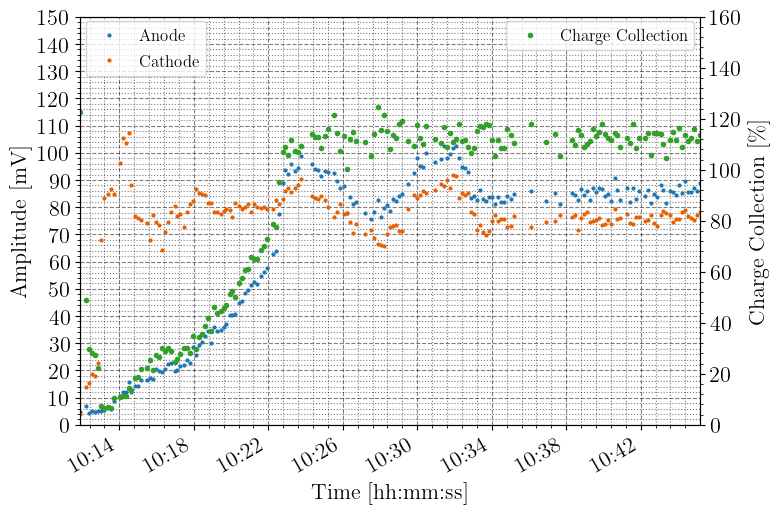

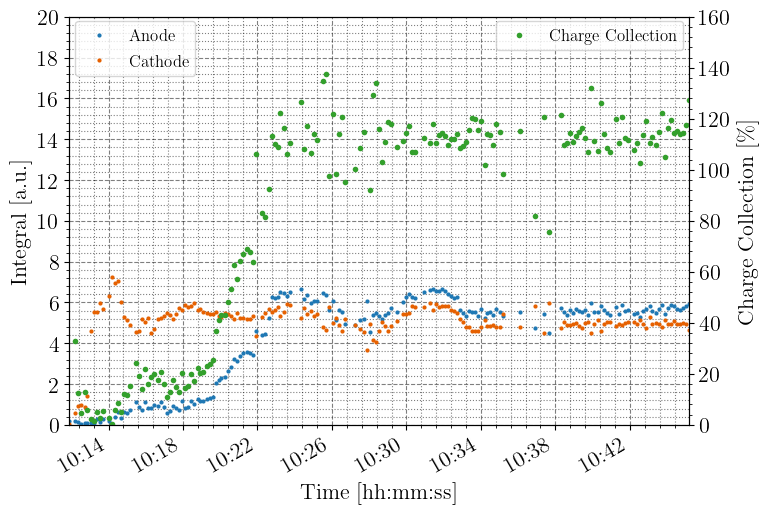

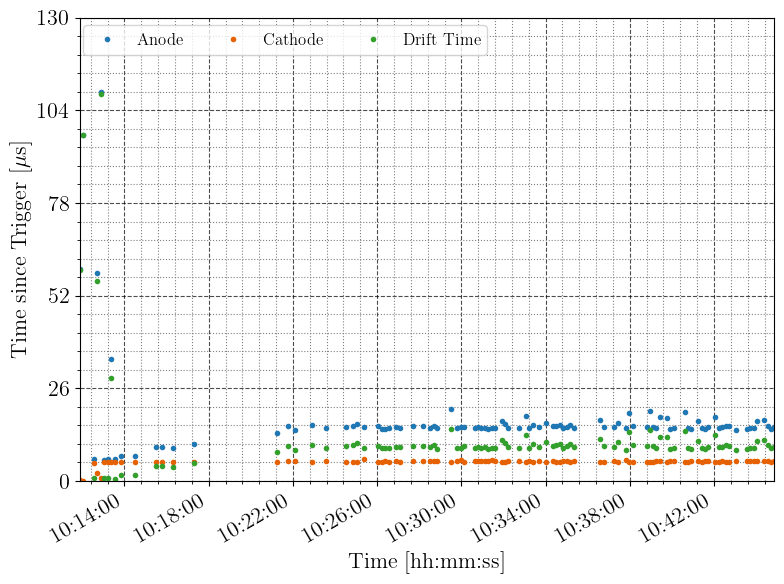

In [5]:
D1 = Dataset.Dataset(Path='C:/Data/20210315/', Selection='Filling**')
D1.RunStandardAnalysis()
D1.ShowAmplitudeVsTime(YTicks=10, YMax=150)
D1.ShowIntegralVsTime(YTicks=2, YMax=20)
D1.ShowDrifttimeVsTime()

 | Filename... C:/Data/20210315\LongerSHVCable_Au-Thorslabs_C-300V_A-1800V_1.h5
 | Number of files in ch1...	 76/76
 | Number of files in ch2...	 76/76
 | Filename... C:/Data/20210315\LongerSHVCable_Au-Thorslabs_C-300V_A-1800V_2.h5
 | Number of files in ch1...	 320/396
 | Number of files in ch2...	 320/396
 | Filename... C:/Data/20210315\LongerSHVCable_Au-Thorslabs_C-300V_A-1800V_3.h5
 | Number of files in ch1...	 141/537
 | Number of files in ch2...	 141/537
 | Filename... C:/Data/20210315\LongerSHVCable_Au-Thorslabs_C-300V_A-1800V_4.h5
 | Number of files in ch1...	 435/972
 | Number of files in ch2...	 435/972
 | Filename... C:/Data/20210315\LongerSHVCable_Au-Thorslabs_C-300V_A-1800V_6.h5
 | Number of files in ch1...	 130/1102
 | Number of files in ch2...	 130/1102
 | Processing data in channel 1...
 | Processing data in channel 2...
 | Time elapsed:  52.25 sec
984
1003
984
1003


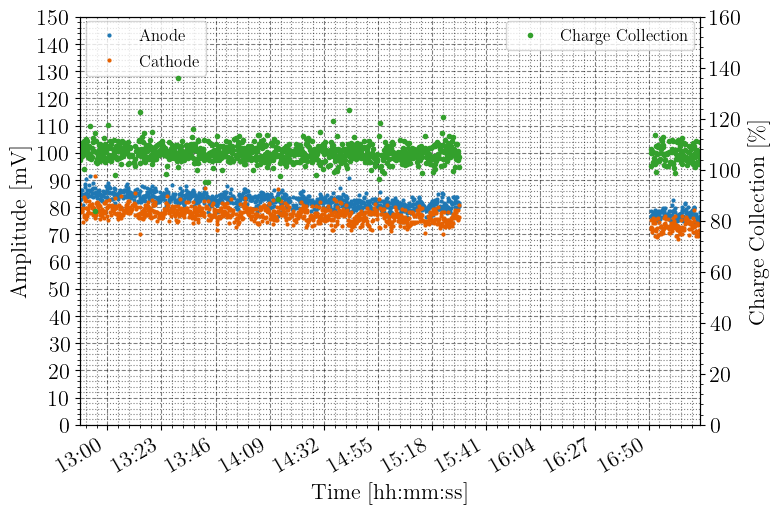

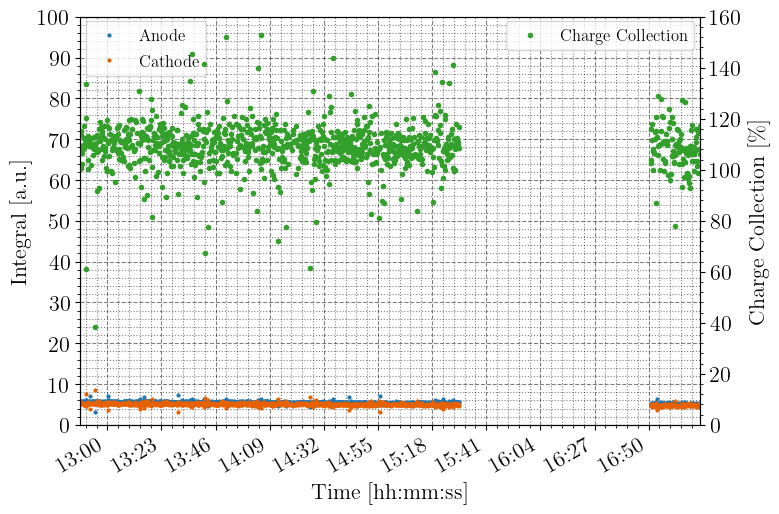

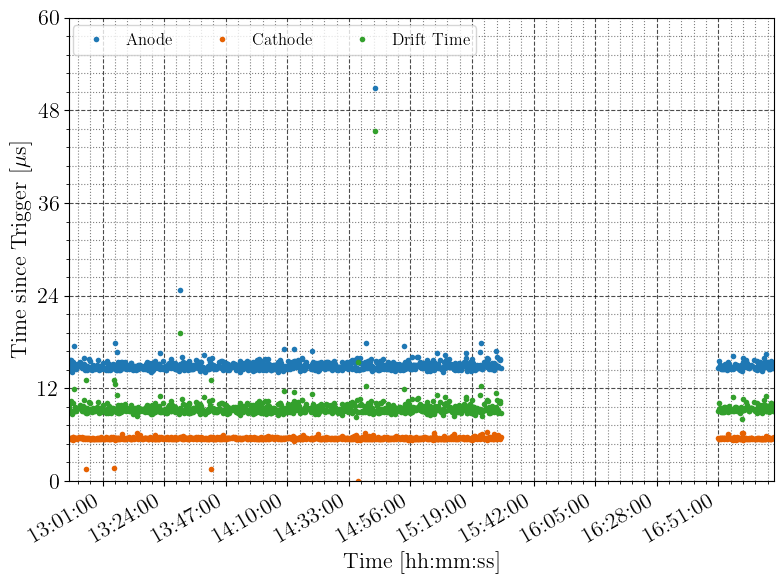

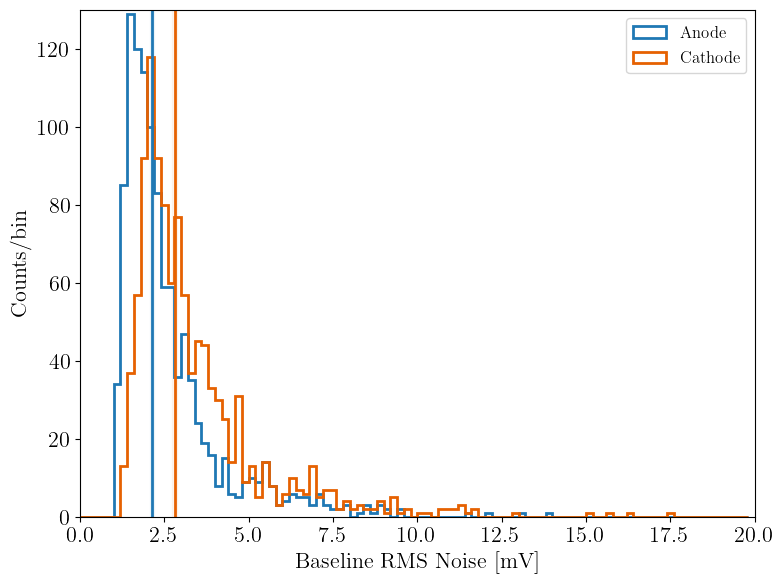

In [6]:
D2 = Dataset.Dataset(Path='C:/Data/20210315/', Selection='LongerSHV*')
D2.RunStandardAnalysis()
D2.ShowAmplitudeVsTime(YTicks=10, YMax=150)
D2.ShowIntegralVsTime(YTicks=10, YMax=100)
D2.ShowDrifttimeVsTime()
D2.ShowBaselineNoise(BinMax=20)

[1.30311166e+00 7.24461424e-04]


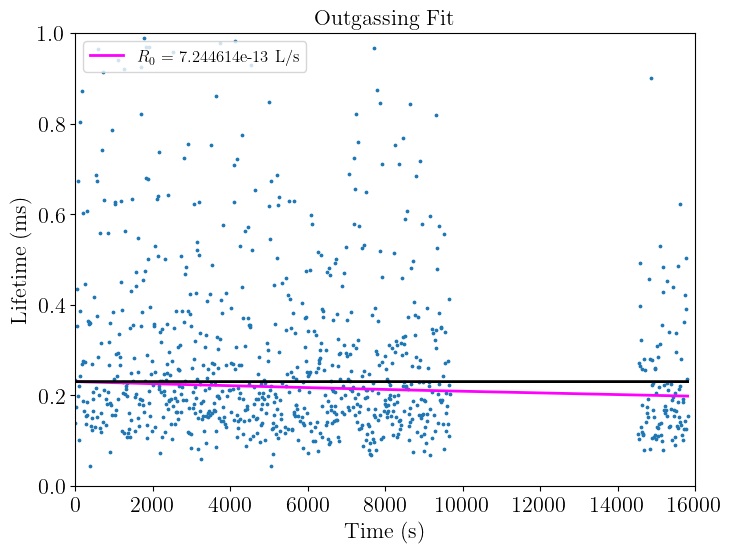

In [7]:
from scipy.optimize import curve_fit

time = np.array([(each_time-np.min(D2.Ch[0].TimeStamp)).total_seconds() for each_time in D2.Ch[0].TimeStamp])
collection = D2.ChargeCollection

drift_time = D2.Ch[0].DriftTime-D2.Ch[1].DriftTime #in us
offset = 0.1
life_time = - drift_time/np.log(collection-offset) 
alpha = 0.3
M = 0.3 #in kg
rho = 5.5E-3 #kg/liter

cut = np.where(((collection-offset) < 0.98) & (life_time>0))

def outgassing_func(t, n, R):
    return alpha / (n + (R*rho*t/M))

params, covs = curve_fit(outgassing_func, time[cut], life_time[cut]/1000, p0 = [.05E-9, 3.0E-10])
print(params)

n, R = params[0], params[1]
outgassing_fit = alpha / (n + (R*rho*time/M))

plt.figure()

plt.scatter(time, life_time/1000, s=3)
plt.plot(time, outgassing_fit, label='$R_0$ = {:3e} L/s'.format(params[1]*10**-9), color='magenta')
plt.plot(time, [outgassing_fit[0]]*len(time), color='k')
plt.title('Outgassing Fit')
plt.xlabel('Time (s)')
plt.ylabel('Lifetime (ms)')
plt.ylim(0, 1)
plt.legend()

In [8]:
exo = pd.read_csv("../data/exo200_driftvelocity.csv")
exo.head

<bound method NDFrame.head of    Electric Field  Drift Velocity
0            20.0            0.53
1            38.0            0.90
2            75.0            1.20
3           190.0            1.50
4           380.0            1.70
5           570.0            1.80
6           620.0            1.83>

 | Filename... C:/Data/20210315\DriftVelocity_Au-Thorslabs_C-100V_A-600V_1.h5
 | Number of files in ch1...	 37/37
 | Number of files in ch2...	 37/37
 | Filename... C:/Data/20210315\DriftVelocity_Au-Thorslabs_C-10V_A-60V_1.h5
 | Number of files in ch1...	 21/58
 | Number of files in ch2...	 21/58
 | Filename... C:/Data/20210315\DriftVelocity_Au-Thorslabs_C-20V_A-120V_1.h5
 | Number of files in ch1...	 175/233
 | Number of files in ch2...	 175/233
 | Filename... C:/Data/20210315\DriftVelocity_Au-Thorslabs_C-300V_A-1800V_1.h5
 | Number of files in ch1...	 114/347
 | Number of files in ch2...	 114/347
 | Filename... C:/Data/20210315\DriftVelocity_Au-Thorslabs_C-50V_A-300V_1.h5
 | Number of files in ch1...	 75/422
 | Number of files in ch2...	 75/422
 | Processing data in channel 1...
 | Processing data in channel 2...
 | Time elapsed:  67.734375 sec
363
382
363
382


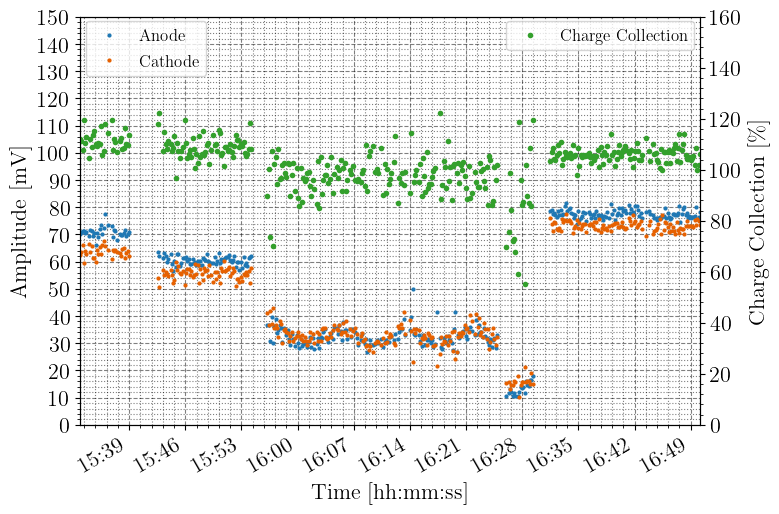

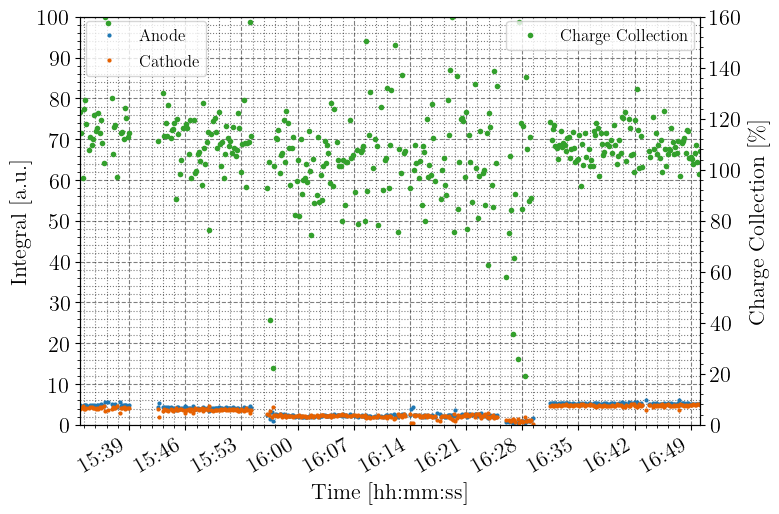

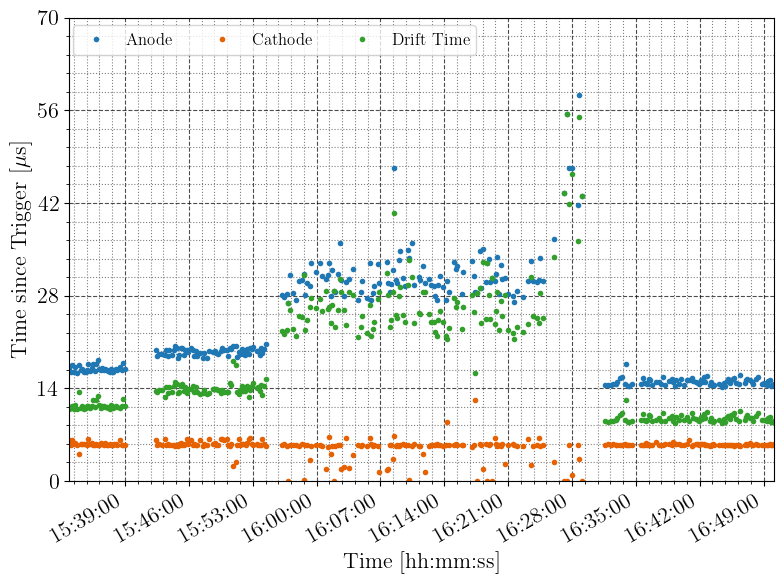

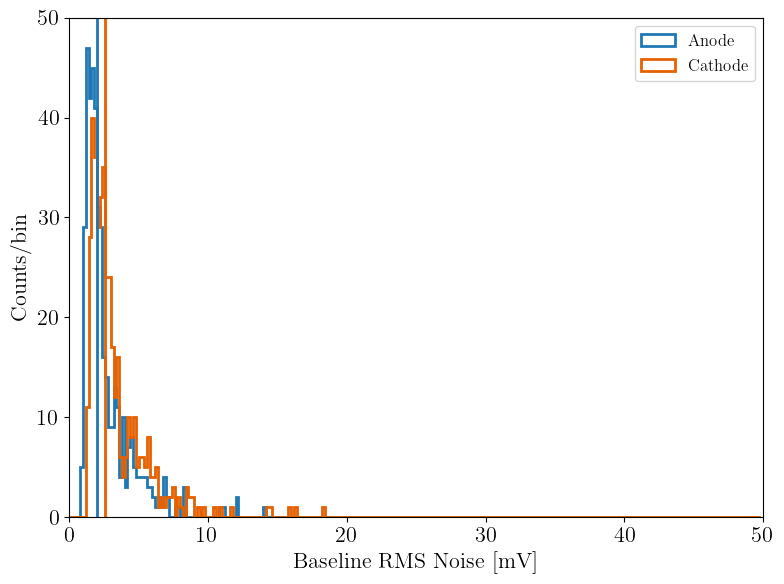

In [9]:
D3 = Dataset.Dataset(Path='C:/Data/20210315/', Selection='DriftVelocity_Au-Thorslabs_*')
D3.RunStandardAnalysis()
D3.ShowAmplitudeVsTime(YTicks=10, YMax=150)
D3.ShowIntegralVsTime(YTicks=10, YMax=100)
D3.ShowDrifttimeVsTime()
D3.ShowBaselineNoise(BinMax=50)

 | Filename... C:/Data/20210315\DriftVelocity_Au-Thorslabs_C-10V_A-60V_1.h5
 | Number of files in ch1...	 21/21
 | Number of files in ch2...	 21/21
 | Processing data in channel 1...
 | Processing data in channel 2...
 | Time elapsed:  72.4375 sec
 | Filename... C:/Data/20210315\DriftVelocity_Au-Thorslabs_C-20V_A-120V_1.h5
 | Number of files in ch1...	 175/175
 | Number of files in ch2...	 175/175
 | Processing data in channel 1...
 | Processing data in channel 2...
 | Time elapsed:  76.921875 sec
 | Filename... C:/Data/20210315\DriftVelocity_Au-Thorslabs_C-50V_A-300V_1.h5
 | Number of files in ch1...	 75/75
 | Number of files in ch2...	 75/75
 | Processing data in channel 1...
 | Processing data in channel 2...
 | Time elapsed:  78.859375 sec
 | Filename... C:/Data/20210315\DriftVelocity_Au-Thorslabs_C-100V_A-600V_1.h5
 | Number of files in ch1...	 37/37
 | Number of files in ch2...	 37/37
 | Processing data in channel 1...
 | Processing data in channel 2...
 | Time elapsed:  79.85937

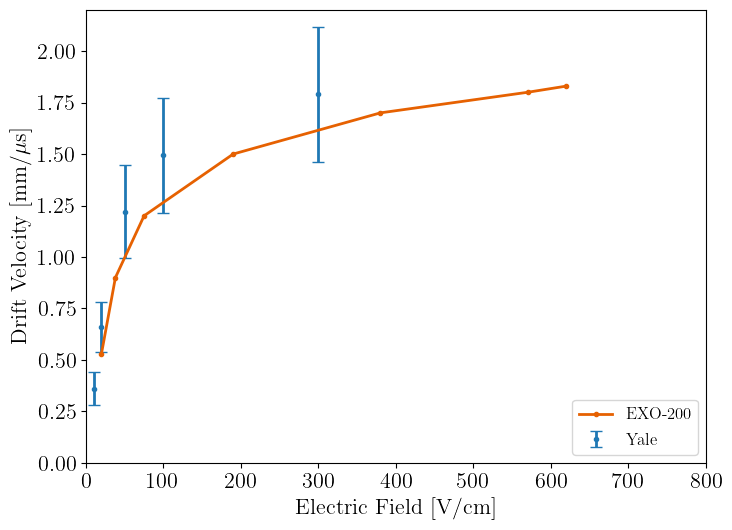

In [10]:
efield = [10,20,50,100,300]
vel = []
err = []
for field in efield:
    D3 = Dataset.Dataset(Path='C:/Data/20210315/', Selection='DriftVelocity_Au-Thorslabs_C-%dV*' % field)
    D3.RunStandardAnalysis()
    DriftTime = np.mean(D3.Ch[0].DriftTime - D3.Ch[1].DriftTime )
    DriftTimeErr = np.std(D3.Ch[0].DriftTime - D3.Ch[1].DriftTime )/np.sqrt(len(D3.Ch[0].DriftTime))
    DriftVelocity = 17.0/DriftTime
    DriftVelocityErr = np.max([np.abs(DriftVelocity-20.0/(DriftTime+DriftTimeErr)), np.abs(DriftVelocity-20.0/(DriftTime-DriftTimeErr))])
    vel.append(DriftVelocity)
    err.append(DriftVelocityErr)

fig = plt.figure(figsize=(8,6))
plt.xlabel('Electric Field [V/cm]')
plt.ylabel('Drift Velocity [mm/$\mu$s]')
plt.xlim(0,800)
plt.ylim(0,2.2)

plt.errorbar(exo['Electric Field'], exo['Drift Velocity'], color=colors[1], marker='o', markersize=3, label='EXO-200')
plt.errorbar(efield, vel, yerr=err, marker='o', markersize=3, capsize=4, ls='None', color=colors[0], label='Yale')

plt.legend(loc='lower right')
plt.savefig('driftvel_vs_field.png')
plt.show() 

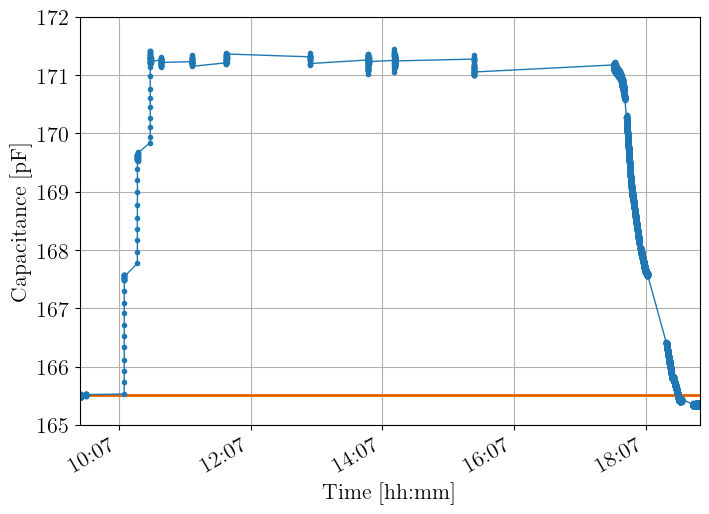

In [11]:
import datetime
import matplotlib

capdata = pd.read_csv("C:/Users/nEXO/Desktop/20210315_cap.csv")
timestamp = [datetime.datetime.strptime(x, "%H:%M:%S %y/%m/%d") for x in capdata['Time - Plot 0']]
formatter = matplotlib.dates.DateFormatter('%H:%M')

fig = plt.figure()
ax = fig.gca()

plt.gcf().axes[0].xaxis.set_major_formatter(formatter)
plt.gcf().autofmt_xdate()
plt.grid()
plt.xlabel('Time [hh:mm]')
plt.ylabel('Capacitance [pF]')
plt.hlines(capdata['Capacitance [pF] - Plot 0'][0], xmin=timestamp[0], xmax=timestamp[-1], color=colors[1])
plt.xlim(timestamp[0], timestamp[-1])
ax.xaxis.set_major_locator(matplotlib.dates.MinuteLocator(interval=120))

plt.errorbar(timestamp, capdata['Capacitance [pF] - Plot 0'], yerr=0.01, capsize=1, marker='o', ms=3, lw=1)
plt.savefig('cap_vs_time.png')
plt.show() 